Success: uproot, vector, and awkward are loaded.
--- START OF H -> 4l ANALYSIS (Real Data) ---
Attempting to load a maximum of 100000 events per file...
Step 1: Raw Data read OK
Diagnostic: Read 100000 events. Number of Muons in the first event: 3
Step 2: Flatten OK
Step 3: ID OK
DEBUG: Type/Dtype of df['pt'].values: <class 'numpy.ndarray'> / float64
DEBUG: Type/Dtype of df['eta'].values: <class 'numpy.ndarray'> / float64
DEBUG: Type/Dtype of df['phi'].values: <class 'numpy.ndarray'> / float64
DEBUG: Type/Dtype of df['mass'].values: <class 'numpy.ndarray'> / float64
Success: 235079 leptons loaded from DoubleMuon_B.
Step 1: Raw Data read OK
Diagnostic: Read 100000 events. Number of Muons in the first event: 3
Step 2: Flatten OK
Step 3: ID OK
DEBUG: Type/Dtype of df['pt'].values: <class 'numpy.ndarray'> / float64
DEBUG: Type/Dtype of df['eta'].values: <class 'numpy.ndarray'> / float64
DEBUG: Type/Dtype of df['phi'].values: <class 'numpy.ndarray'> / float64
DEBUG: Type/Dtype of df['mass']

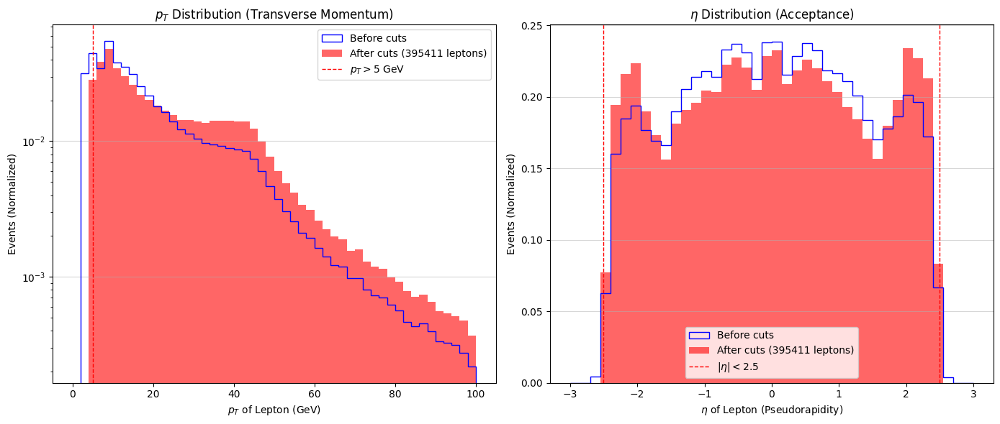


--- STATUS: Quality cuts applied and verified. ---

Preview of filtered leptons (ready for combination):
    event_id         pt  charge  flavor         iso
0  599701946  30.409157       1      13 -999.000000
1  599701946  33.029179       1      13 -999.000000
2  599721392  10.679796       1      13 -999.000000
3  599895577  56.900928       1      13    0.006498
4  599895577  34.670677      -1      13    0.000000

Step 5: Applying event-level filtering (4 leptons and zero net charge)...
Success: 'lv' column safely regenerated and re-attached to final candidates.
-> Initial Events: 258221
-> Final Events (4l, net charge 0): 822
-> Total Leptons remaining: 3288

--- STATUS: Event selection complete ---

Preview of H -> 4l candidate leptons:


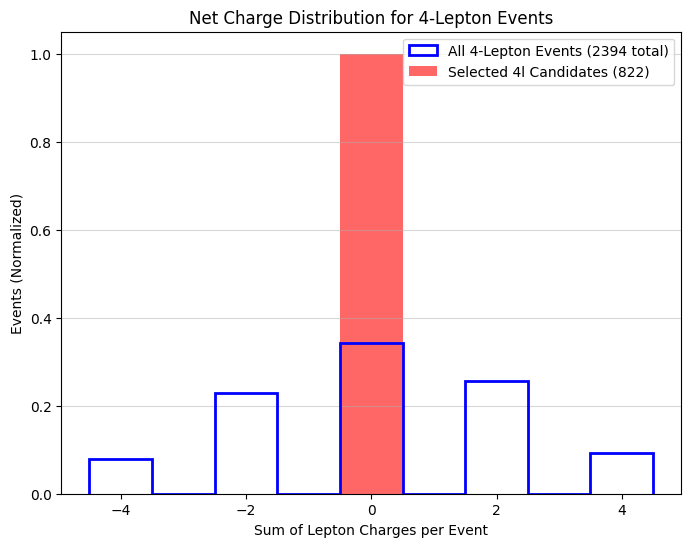

<>:13: SyntaxWarning: invalid escape sequence '\e'
<>:18: SyntaxWarning: invalid escape sequence '\e'
<>:19: SyntaxWarning: invalid escape sequence '\e'
/tmp/ipykernel_17208/2501924580.py:13: SyntaxWarning: invalid escape sequence '\e'
  plt.hist(z_boson_df['h_mass'], bins=20, range=(100, 150), color='skyblue', edgecolor='black', alpha=0.7, label='$M_{4\ell}$ Distribution')
/tmp/ipykernel_17208/2501924580.py:18: SyntaxWarning: invalid escape sequence '\e'
  plt.title('Distribution de la Masse Invariante $M_{4\ell}$ (Candidats Higgs)')
/tmp/ipykernel_17208/2501924580.py:19: SyntaxWarning: invalid escape sequence '\e'
  plt.xlabel('Masse Invariante $M_{4\ell}$ (GeV)')


13.0 13.0 1.0 1.0
13.0 13.0 1.0 -1.0
candidate
MomentumObject4D(pt=23.017152786254883, phi=-2.3024046421051025, eta=-1.0461078882217407, mass=0.10565836727619171)
13.0 13.0 1.0 -1.0
candidate
MomentumObject4D(pt=23.017152786254883, phi=-2.3024046421051025, eta=-1.0461078882217407, mass=0.10565836727619171)
13.0 13.0 1.0 -1.0
candidate
MomentumObject4D(pt=47.00136184692383, phi=-2.3054440021514893, eta=-1.031141996383667, mass=0.10565836727619171)
13.0 13.0 1.0 -1.0
candidate
MomentumObject4D(pt=47.00136184692383, phi=-2.3054440021514893, eta=-1.031141996383667, mass=0.10565836727619171)
13.0 13.0 -1.0 -1.0
13.0 13.0 -1.0 1.0
candidate
MomentumObject4D(pt=46.038063049316406, phi=1.7820830345153809, eta=0.2757343351840973, mass=0.10565836727619171)
13.0 13.0 -1.0 1.0
candidate
MomentumObject4D(pt=46.038063049316406, phi=1.7820830345153809, eta=0.2757343351840973, mass=0.10565836727619171)
13.0 13.0 -1.0 -1.0
13.0 13.0 1.0 1.0
13.0 13.0 1.0 -1.0
candidate
MomentumObject4D(pt=16.0298690795

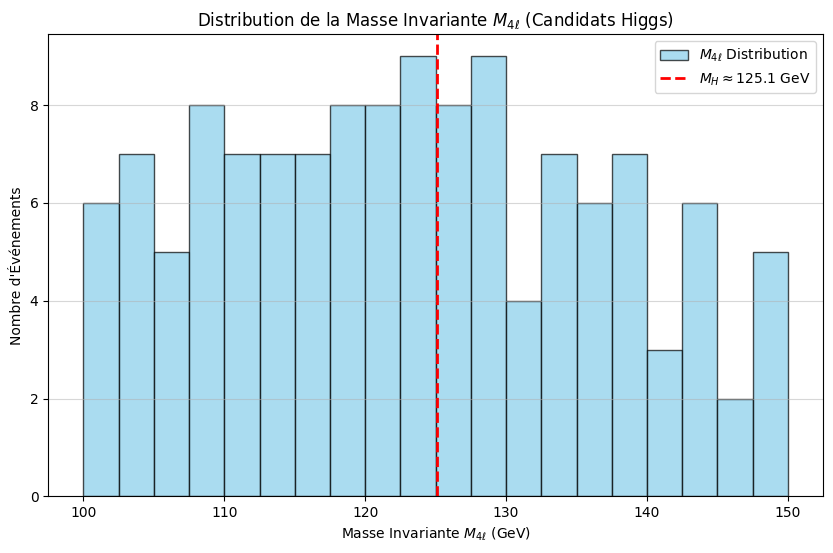


Histogramme de la masse invariante du Higgs (M_4l) généré pour 821 événements.

Analyse terminée. Interprétez cet histogramme pour le pic de signal.


In [4]:
%run ../4_Z_Candidate_Selection/main.ipynb

In [2]:
def get_n_generated_events(mc_files, tree_name: str):
    """
    Détermine le nombre total d'événements MC générés (N_gen) en lisant
    le nombre total d'entrées (num_entries) de l'arbre principal TREE_NAME.
    
    ATTENTION: Cette méthode suppose que l'arbre 'Events' contient TOUS les événements
    générés par la simulation (avant toute coupure d'analyse).

    Args:
        mc_files (Dict[str, str]): Dictionnaire {Nom_Dataset: Chemin_Fichier_ROOT}.
        tree_name (str): Nom de l'arbre principal (doit être 'Events' ou équivalent).

    Returns:
        Dict[str, int]: Dictionnaire {Nom_Dataset: N_GEN_TOTAL}.
    """
    n_gen_data = {}
    print("\n--- Détermination automatique de N_GEN_DATA_ZZ (via num_entries) ---")

    for name, path in mc_files.items():
        try:
            with uproot.open(path) as file:
                # Lecture directe du nombre d'entrées de l'arbre 'Events'
                n_total = file[tree_name].num_entries
                
                print(f"Lu {n_total} événements générés pour {name} via num_entries de '{tree_name}'.")
                
                n_gen_data[name] = n_total

        except FileNotFoundError:
            print(f"ERREUR: Fichier non trouvé pour {name} : {path}")
            n_gen_data[name] = 1 # Valeur par défaut pour éviter la division par zéro
        except Exception as e:
            print(f"ERREUR lors de la lecture de {name} ({path}): {e}")
            n_gen_data[name] = 1

    print("--- Fin de la détermination N_GEN ---")
    return n_gen_data


In [7]:

# --- 1. DÉFINITION DES CHEMINS ET CONSTANTES ---

# Fichiers de simulation Monte Carlo pour le fond (background) ZZ -> 4l
# NOTE: Ces chemins sont des exemples et DOIVENT être ajustés
MC_BACKGROUND_FILES = {
   'ZZTo4mu': '../../data/12362/ZZTo4mu.root',     
    'ZZTo4e': '../../data/12363/ZZTo4e.root',
    'ZZTo2e2mu_4e': '../../data/12364/ZZTo2e2mu.root',
    'ZZTo2e2mu_4mu': '../../data/12364/ZZTo2e2mu.root'
}
TREE_NAME = 'Events'

# Nombre total d'événements générés dans la simulation pour chaque échantillon (EXEMPLE)
# IMPORTANT: Remplacez par vos N_MC_total exacts !
N_GEN_DATA_ZZ = get_n_generated_events(MC_BACKGROUND_FILES, TREE_NAME)

# Luminosité intégrée du run d'acquisition (en fb^-1) - EXEMPLE 2012
LUMINOSITY_INV_FB = 12.1

# Section efficace théorique (cross-section, en femtobarns, fb)
# ZZ -> 4l est le fond principal
MC_CROSS_SECTIONS_FB = {
    "ZZTo4L_GLOBAL_SIGMA": 17600.0, # Section efficace globale pour ZZ -> 4l
}


MAX_EVENTS_PER_FILE = 100000 # Limite pour le test


--- Détermination automatique de N_GEN_DATA_ZZ (via num_entries) ---
Lu 1499064 événements générés pour ZZTo4mu via num_entries de 'Events'.
Lu 1499093 événements générés pour ZZTo4e via num_entries de 'Events'.
Lu 1497445 événements générés pour ZZTo2e2mu_4e via num_entries de 'Events'.
Lu 1497445 événements générés pour ZZTo2e2mu_4mu via num_entries de 'Events'.
--- Fin de la détermination N_GEN ---


In [8]:
# --- 4. FONCTIONS DE POIDS ET DE NORMALISATION MC ---

def calculate_mc_weight(cross_section_fb: float, n_mc_total: int) -> float:
    """
    Calcule le facteur de poids MC (normalisation) : W = (L * sigma) / N_MC_total
    """
    print(f"\n--- Détails du Calcul de Poids MC ---")
    print(f"Luminosité (L)       : {LUMINOSITY_INV_FB} fb⁻¹")
    print(f"Section Efficace (σ) : {cross_section_fb} fb")
    print(f"N_MC_total           : {n_mc_total}")
    
    if n_mc_total <= 0:
        print("Avertissement: N_MC_total est nul. Poids retourné: 0.0.")
        return 0.0
    
    weight_factor = (LUMINOSITY_INV_FB * cross_section_fb) / n_mc_total
    
    print(f"Facteur de Poids MC  : {weight_factor:.8f}")
    
    return weight_factor

def apply_weight_to_df(df, weight_factor):
    """Ajoute une colonne 'weight' au DataFrame avec le facteur calculé."""
    if df.empty:
        return df
        
    df['weight'] = weight_factor
    print(f"Poids MC {weight_factor:.8f} appliqué à {len(df)} événements.")
    return df



In [9]:
# --- 5. FONCTION DE TRACÉ ---

def plot_higgs_mass_mc(df, weights=None):
    """Trace l'histogramme de la masse invariante M4l, avec normalisation optionnelle."""
    if df.empty:
        print("Impossible de tracer l'histogramme, le DataFrame est vide.")
        return
        
    plt.figure(figsize=(10, 6))
    
    if weights is not None and not df['weight'].isnull().all():
        # Utiliser les poids pour la normalisation
        plt.hist(df['h_mass'], bins=30, range=(100, 160), weights=weights, 
                 histtype='stepfilled', color='lightblue', edgecolor='black', 
                 label=f'MC $ZZ \\to 4\\ell$ (Normalisé à {LUMINOSITY_INV_FB} $fb^{{-1}}$)')
        plt.ylabel('Nombre d\'événements Normalisés')
    else:
        # Tracer les comptes bruts si les poids ne sont pas fournis
        plt.hist(df['h_mass'], bins=30, range=(100, 160), 
                 histtype='step', color='red', linewidth=2, 
                 label='MC $ZZ \\to 4\\ell$ (Comptes Bruts)')
        plt.ylabel('Nombre d\'événements (Comptes Bruts)')

    plt.xlabel('Masse Invariante $M_{4\\ell}$ (GeV)')
    plt.title('Distribution de $M_{4\\ell}$ pour le Fond MC $ZZ \\to 4\\ell$')
    plt.grid(axis='y', alpha=0.5)
    plt.legend()
    plt.show()
    print("\nAnalyse MC terminée. Interprétez cet histogramme pour le fond normalisé.")


--- START OF MC ANALYSIS (Genereated DATA) ---
Attempting to load a maximum of 100000 events per file...
Step 1: Raw Data read OK
Diagnostic: Read 100000 events. Number of Muons in the first event: 1
Step 2: Flatten OK
Step 3: ID OK
DEBUG: Type/Dtype of df['pt'].values: <class 'numpy.ndarray'> / float64
DEBUG: Type/Dtype of df['eta'].values: <class 'numpy.ndarray'> / float64
DEBUG: Type/Dtype of df['phi'].values: <class 'numpy.ndarray'> / float64
DEBUG: Type/Dtype of df['mass'].values: <class 'numpy.ndarray'> / float64
Success: 252569 leptons loaded from ZZTo4mu.
Step 1: Raw Data read OK
Diagnostic: Read 100000 events. Number of Electrons in the first event: 3
Step 2: Flatten OK
Step 3: ID OK
DEBUG: Type/Dtype of df['pt'].values: <class 'numpy.ndarray'> / float64
DEBUG: Type/Dtype of df['eta'].values: <class 'numpy.ndarray'> / float64
DEBUG: Type/Dtype of df['phi'].values: <class 'numpy.ndarray'> / float64
DEBUG: Type/Dtype of df['mass'].values: <class 'numpy.ndarray'> / float64
Succes

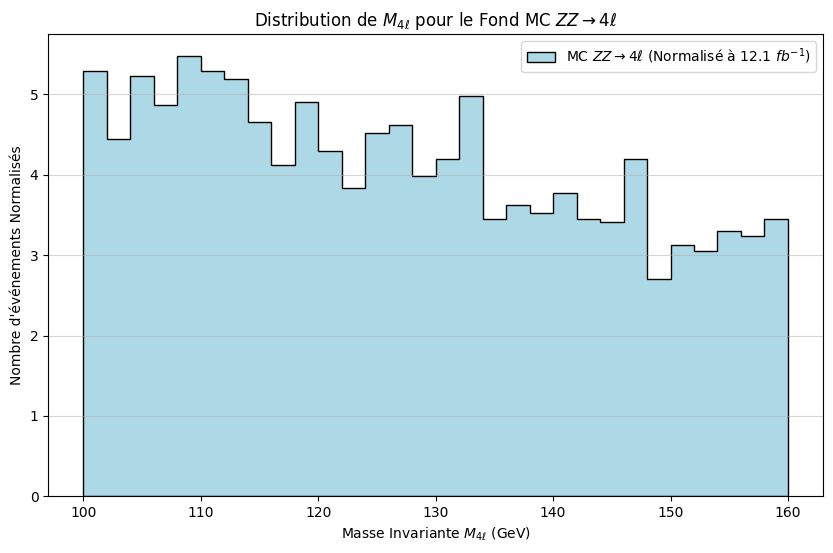


Analyse MC terminée. Interprétez cet histogramme pour le fond normalisé.


In [11]:


    # --- 5. MAIN EXECUTION ---
print("--- START OF MC ANALYSIS (Genereated DATA) ---")

# 1. Load the original data
all_leptons_df_initial_mc = load_and_flatten_data(MC_BACKGROUND_FILES, MAX_EVENTS)

if not all_leptons_df_initial_mc.empty:
    # 2. Apply individual quality cuts
    filtered_leptons_df_mc = apply_quality_cuts(all_leptons_df_initial_mc)

    cleaned_leptons_df_mc = clean_kinematic_data(filtered_leptons_df_mc)
    # 4. CREATION OF LORENTZ VECTORS ON ALL FILTERED DATA (The right way)
    print("\nStep 4: Creation of Lorentz Vector (lv) objects on the complete filtered DataFrame...")
    try:
        vector_array_temp = vector.array({
            "pt": cleaned_leptons_df_mc['pt'],
            "eta": cleaned_leptons_df_mc["eta"],
            "phi": cleaned_leptons_df_mc["phi"],
            "mass": cleaned_leptons_df_mc["mass"]
        })

        cleaned_leptons_df_mc['lv'] = vector_array_temp


        print("Success: 'lv' column of Lorentz vectors added to the DataFrame.")
        print(cleaned_leptons_df_mc['lv'].values.dtype)

    except Exception as e:
        print(f"\nCRITICAL ERROR during creation of 'lv' column: {e}")
        print("The analysis cannot continue. Please check the installation or version of 'vector'.")


    # 3. VERIFICATION: Display diagnostics
    #plot_kinematic_diagnostics(all_leptons_df_initial, cleaned_leptons_df)

    # 4. Confirm the next step
    print("\n--- STATUS: Quality cuts applied and verified. ---")

    if not cleaned_leptons_df_mc.empty:
        print("\nPreview of filtered leptons (ready for combination):")
        print(cleaned_leptons_df_mc[['event_id', 'pt', 'charge', 'flavor', 'iso']].head())

    four_lepton_candidates_df_mc, all_four_leptons_df_mc = group_leptons_by_event_with_diagnostic_data(cleaned_leptons_df_mc)
    print("\n--- STATUS: Event selection complete ---")

    if four_lepton_candidates_df_mc.empty:
        print("\nAnalyse arrêtée : Aucun candidat 4-lepton n'a passé les coupures d'événement.")
        exit()
        
    # Étape 3: Calcul du Poids Global MC
    files_to_sum = list(N_GEN_DATA_ZZ.keys())
    total_n_generated_zz = sum(N_GEN_DATA_ZZ.get(key, 0) for key in files_to_sum)
    TOTAL_CROSS_SECTION = MC_CROSS_SECTIONS_FB.get('ZZTo4L_GLOBAL_SIGMA', 0.0)
    
    GLOBAL_MC_WEIGHT = calculate_mc_weight(
        cross_section_fb=TOTAL_CROSS_SECTION, 
        n_mc_total=total_n_generated_zz
    )

    # Étape 4: Sélection Z1/Z2 et Calcul de M4l
    z_boson_df_mc = find_z_candidates(four_lepton_candidates_df_mc)

    # Étape 5: Application du Poids et Tracé
    if not z_boson_df_mc.empty:
        z_boson_df_mc = apply_weight_to_df(z_boson_df_mc, GLOBAL_MC_WEIGHT)
        
        print("\n--- Aperçu des Candidats H -> 4l MC (M4l) ---")
        print(z_boson_df_mc[['event_id', 'z1_mass', 'z2_mass', 'h_mass', 'weight']].head())
        
        # Tracé avec la normalisation
        plot_higgs_mass_mc(z_boson_df_mc, weights=z_boson_df_mc['weight'])
    else:
        print("\nAucun candidat final après la sélection Z. Impossible de tracer l'histogramme.")
